## Feature Analysis

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import data_processing
import feature_extraction

Load dataset

In [2]:
feature_df = pd.read_csv("mode_classification_features.csv")

Plot

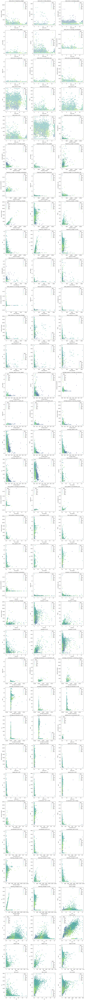

In [60]:
features = [col for col in feature_df.columns if col not in ['label', 'trajectory']]


# Define number of columns per row
cols_per_row = 3  # Change this value to control the layout
num_plots = len(features) * (len(features) - 1) // 2  # Number of unique feature pairs
rows = (num_plots + cols_per_row - 1) // cols_per_row  # Calculate required rows

# Create subplots with controlled layout
fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 5 * rows))
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Loop through unique feature pairs and plot
plot_idx = 0
for i in range(len(features)):
    for j in range(i + 1, len(features)):  # Ensure unique pairs
        feature1 = features[i]
        feature2 = features[j]

        # Scatter plot
        sns.scatterplot(ax=axes[plot_idx], data=feature_df, x=feature1, y=feature2, hue=feature_df['label'], palette='viridis', alpha=0.7)

        # Set plot titles
        axes[plot_idx].set_title(f"{feature1} vs {feature2}")

        plot_idx += 1

# Remove empty subplots (if any)
for i in range(plot_idx, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()
plt.show()

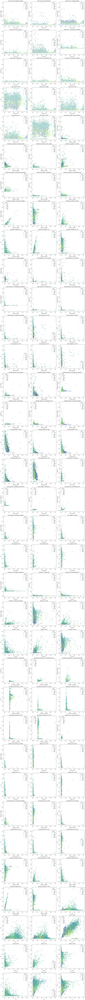

In [56]:
# Normalize data using Min-Max Scaling or Standardization
scaler = MinMaxScaler()  # Alternative: StandardScaler()
feature_df[features] = scaler.fit_transform(feature_df[features])  # Normalize only feature columns

# Define number of columns per row
cols_per_row = 3  # Change this value to control the layout
num_plots = len(features) * (len(features) - 1) // 2  # Number of unique feature pairs
rows = (num_plots + cols_per_row - 1) // cols_per_row  # Calculate required rows

# Create subplots with controlled layout
fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 5 * rows))

# Ensure axes is always iterable
if num_plots == 1:
    axes = [axes]  # Convert single object to list
else:
    axes = axes.flatten()

# Loop through unique feature pairs and plot
plot_idx = 0
for i in range(len(features)):
    for j in range(i + 1, len(features)):  # Ensure unique pairs
        feature1 = features[i]
        feature2 = features[j]

        # Scatter plot
        sns.scatterplot(ax=axes[plot_idx], data=feature_df, x=feature1, y=feature2, hue=feature_df['label'], palette='viridis', alpha=0.7)

        # Set plot titles
        axes[plot_idx].set_title(f"{feature1} vs {feature2}")

        plot_idx += 1

# Remove empty subplots (if any)
for i in range(plot_idx, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout
plt.tight_layout()
plt.show()

1 Axis

In [4]:

# Convert 'mode' to categorical
feature_df['label'] = feature_df['label'].astype('category')

# Exclude 'trajectory' column and normalize all features
features = [col for col in feature_df.columns if col not in ['label', 'trajectory']]

# Reshape data into long format for single-axis plotting
df_melted = feature_df.melt(id_vars=['label'], var_name='Feature', value_name='label')

# Strip Plot: One axis with all features
plt.figure(figsize=(10, 6))
sns.stripplot(data=df_melted, x='Feature', y='Value', hue='label', palette='viridis', dodge=True, alpha=0.7)

plt.title("All Features on One Axis (Color = Transport Mode)")
plt.xlabel("Feature")
plt.ylabel("Normalized Value")
plt.legend(title="Transport Mode", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


ValueError: value_name (label) cannot match an element in the DataFrame columns.

In [74]:
sns.swarmplot(data=feature_df, x='Feature', y='Value', hue='mode', palette='viridis', dodge=True, alpha=0.7)


ValueError: Could not interpret value `Feature` for `x`. An entry with this name does not appear in `data`.